In [1]:
print("all okay")

all okay


In [2]:
import pathlib
import textwrap

import google.generativeai as genai

from IPython.display import display
from IPython.display import Markdown


def to_markdown(text):
  text = text.replace('•', '  *')
  return Markdown(textwrap.indent(text, '> ', predicate=lambda _: True))

d:\Personal\GEN_AI\GEMINI_AI\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [40]:
from dotenv import load_dotenv

load_dotenv(".env")
import os

google_api_key = os.getenv("GOOGLE_API_KEY")
# print(google_api_key)

In [6]:
genai.configure(api_key=google_api_key)

In [7]:
for m in genai.list_models():
  if 'generateContent' in m.supported_generation_methods:
    print(m.name)

models/gemini-1.0-pro
models/gemini-1.0-pro-001
models/gemini-1.0-pro-latest
models/gemini-1.0-pro-vision-latest
models/gemini-pro
models/gemini-pro-vision


In [8]:
model = genai.GenerativeModel('gemini-pro')

In [11]:
%%time
response = model.generate_content("What is large language models?")

CPU times: total: 0 ns
Wall time: 7.83 s


In [12]:
to_markdown(response.text)

> **Large Language Models (LLMs)**
> 
> Large Language Models are advanced artificial intelligence (AI) models that are trained on massive datasets of text and code. They possess the ability to generate human-like text, translate languages, answer questions, and perform various natural language processing tasks.
> 
> **Characteristics of LLMs:**
> 
> * **Massive datasets:** Trained on billions or even trillions of words or lines of code.
> * **Deep neural network architecture:** Employ deep learning techniques, typically using transformers.
> * **Self-attention mechanisms:** Capture long-range dependencies and relationships in text.
> * **Contextual learning:** Understand the meaning of words and phrases based on their surrounding context.
> 
> **Types of LLMs:**
> 
> * **GPT (Generative Pre-trained Transformer):** Developed by OpenAI, known for language generation and text completion.
> * **BERT (Bidirectional Encoder Representations from Transformers):** Developed by Google, focuses on text understanding and question answering.
> * **XLNet (Generalized Autoregressive Pretraining for Language Understanding):** Developed by Google AI, combines strengths of BERT and GPT.
> * **T5 (Text-To-Text Transfer Transformer):** Developed by Google AI, excels at a wide range of NLP tasks.
> 
> **Applications of LLMs:**
> 
> * **Natural language processing (NLP):** Text generation, machine translation, question answering, sentiment analysis.
> * **Chatbots and virtual assistants:** Improving responses and personalization.
> * **Code generation:** Automating code completion and generating new code snippets.
> * **Content creation:** Writing website content, blog posts, and even novels.
> * **Research:** Advancing NLP research and developing new AI applications.
> 
> **Benefits of LLMs:**
> 
> * **High accuracy:** Generate text that is often indistinguishable from human-written content.
> * **Versatility:** Perform a wide range of NLP tasks effectively.
> * **Scalability:** Can be trained on even larger datasets to improve performance.
> 
> **Limitations of LLMs:**
> 
> * **Bias:** Can inherit biases from the training data.
> * **Factual errors:** May generate text that contains factual errors or inaccuracies.
> * **Coherence:** Can struggle to generate long, coherent text without inconsistencies.
> 
> **Future of LLMs:**
> 
> LLMs are rapidly evolving and continuously improving. Research and development efforts are focused on addressing limitations and expanding their capabilities. As technology advances, LLMs are likely to play an increasingly significant role in various industries and applications.

feedback and candidates 

In [15]:
# response.prompt_feedback

In [16]:
# response.candidates

## Streaming

By default, the model returns a response after completing the entire generation process. You can also stream the response as it is being generated, and the model will return chunks of the response as soon as they are generated.

To stream responses, use <a href="https://ai.google.dev/api/python/google/generativeai/GenerativeModel#generate_content"><code>GenerativeModel.generate_content(..., stream=True)</code></a>.

In [18]:
%%time
response = model.generate_content("What is the meaning of life?", stream=True)

for chunk in response:
  print(chunk.text)
  print("_"*80)

The meaning of life is a profound philosophical question that has been pondered by humankind for
________________________________________________________________________________
 centuries. There is no single, universally accepted answer, as the meaning of life is subjective and can vary greatly from person to person. However, some common themes
________________________________________________________________________________
 that emerge in discussions of the meaning of life include:

1. Purpose and Fulfillment: Many people believe that the meaning of life lies in finding a purpose or calling that brings them a sense of fulfillment and accomplishment. This could involve pursuing a career that aligns with their passions, engaging in creative or artistic endeavors, or making
________________________________________________________________________________
 a positive contribution to society.

2. Relationships and Connections: For many, the meaning of life is found in the relationships the

## Generate text from image and text inputs

Gemini provides a multimodal model (`gemini-pro-vision`) that accepts both text and images and inputs. The `GenerativeModel.generate_content` API is designed to handle multimodal prompts and returns a text output.

Let's include an image:

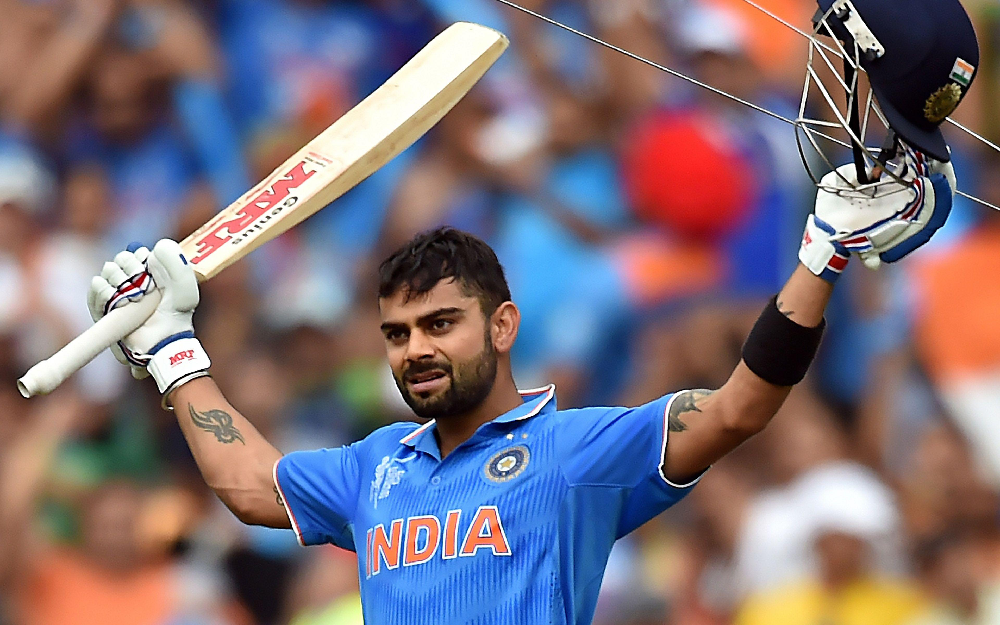

In [24]:
import PIL.Image

img = PIL.Image.open('image.jpg')
img

Use the `gemini-pro-vision` model and pass the image to the model with `generate_content`.

In [22]:
model = genai.GenerativeModel('gemini-pro-vision')

In [25]:
response = model.generate_content(img)

to_markdown(response.text)

>  Virat Kohli is an Indian cricketer who currently captains the India national team. He is a right-handed batsman and occasional right-arm medium pace bowler. He is widely regarded as one of the best batsmen in the world.
> 
> Kohli made his international debut in 2008 and has since played in over 200 One Day Internationals (ODIs), 80 Test matches and 50 Twenty20 Internationals (T20Is). He has scored over 20,000 runs in ODIs, 7,000 runs in Tests and 2,000 runs in T20Is. He is the fastest batsman to reach 10,000 ODI runs and the fastest to reach 20,000 ODI runs.
> 
> Kohli has been praised for his aggressive batting style and his ability to score runs quickly. He is also known for his strong leadership skills and his ability to motivate his team.
> 
> Kohli has won numerous awards for his performances on the cricket field. He was named the ICC Cricketer of the Year in 2017 and 2018. He was also named the Wisden Leading Cricketer in the World in 2018.
> 
> Kohli is a role model for many young cricketers around the world. He is known for his hard work, dedication and passion for the game. He is also known for his humility and his willingness to help others.
> 
> Kohli is a married man and has a daughter. He is a practicing Hindu and is known for his strong belief in karma.

To provide both text and images in a prompt, pass a list containing the strings and images:

In [26]:
response = model.generate_content(["Write a short, engaging blog post based on this picture. It should include a description of the bat in the photo and talk about  journey to be a cricketer", img], stream=True)
response.resolve()
to_markdown(response.text)

>  Virat Kohli is a professional cricketer who plays for the Indian national team. He is widely regarded as one of the best batsmen in the world, and is known for his aggressive batting style and his ability to score runs quickly.
> 
> Kohli was born in Delhi, India, on November 5, 1988. He began playing cricket at the age of three, and quickly showed a natural talent for the game. He made his first-class debut for Delhi in 2006, and scored a century on debut. He was soon selected for the Indian national team, and made his debut in 2008.
> 
> Since then, Kohli has become one of the most successful batsmen in the world. He has scored over 20,000 runs in international cricket, and is the fastest player to reach 10,000 runs in One Day Internationals. He has also scored 70 international centuries, which is the most by any active player.
> 
> Kohli is a modern-day great of the game and an inspiration to young cricketers all over the world. He is a true role model, and his journey to becoming one of the best batsmen in the world is an inspiration to us all.

## Chat conversations

Gemini enables you to have freeform conversations across multiple turns. The `ChatSession` class simplifies the process by managing the state of the conversation, so unlike with `generate_content`, you do not have to store the conversation history as a list.

Initialize the chat:

In [27]:
model = genai.GenerativeModel('gemini-pro')
chat = model.start_chat(history=[])
chat

ChatSession(
    model=genai.GenerativeModel(
        model_name='models/gemini-pro',
        generation_config={},
        safety_settings={},
        tools=None,
    ),
    history=[]
)

Note: The vision model `gemini-pro-vision` is not optimized for multi-turn chat.

The `ChatSession.send_message` method returns the same `GenerateContentResponse` type as <a href="https://ai.google.dev/api/python/google/generativeai/GenerativeModel#generate_content"><code>GenerativeModel.generate_content</code></a>. It also appends your message and the response to the chat history:

In [28]:
response = chat.send_message("In one sentence, explain how a computer works to a young child.")
to_markdown(response.text)

> A computer is like a magic box that takes information, changes it, and shows it to you on the screen.

In [29]:
chat.history

[parts {
   text: "In one sentence, explain how a computer works to a young child."
 }
 role: "user",
 parts {
   text: "A computer is like a magic box that takes information, changes it, and shows it to you on the screen."
 }
 role: "model"]

You can keep sending messages to continue the conversation. Use the `stream=True` argument to stream the chat:

In [30]:
response = chat.send_message("Okay, how about a more detailed explanation to a high schooler?", stream=True)

for chunk in response:
  print(chunk.text)
  print("_"*80)

A computer is an electronic device that can be programmed to carry out a set of
________________________________________________________________________________
 instructions. It consists of hardware, which includes the physical components of the computer, and software, which includes the programs that run on the computer. The hardware includes
________________________________________________________________________________
 the central processing unit (CPU), which is the "brain" of the computer and controls all of its operations; the memory, which stores the programs and data being processed; the storage devices, such as hard drives and solid-state drives, which store programs and data permanently; the input devices, such as keyboards and
________________________________________________________________________________
 mice, which allow the user to interact with the computer; and the output devices, such as monitors and printers, which allow the computer to communicate with the user. 

`glm.Content` objects contain a list of `glm.Part` objects that each contain either a text (string) or inline_data (`glm.Blob`), where a blob contains binary data and a `mime_type`. The chat history is available as a list of `glm.Content` objects in `ChatSession.history`:

In [31]:
for message in chat.history:
  display(to_markdown(f'**{message.role}**: {message.parts[0].text}'))

> **user**: In one sentence, explain how a computer works to a young child.

> **model**: A computer is like a magic box that takes information, changes it, and shows it to you on the screen.

> **user**: Okay, how about a more detailed explanation to a high schooler?

> **model**: A computer is an electronic device that can be programmed to carry out a set of instructions. It consists of hardware, which includes the physical components of the computer, and software, which includes the programs that run on the computer. The hardware includes the central processing unit (CPU), which is the "brain" of the computer and controls all of its operations; the memory, which stores the programs and data being processed; the storage devices, such as hard drives and solid-state drives, which store programs and data permanently; the input devices, such as keyboards and mice, which allow the user to interact with the computer; and the output devices, such as monitors and printers, which allow the computer to communicate with the user. The software includes the operating system, which manages the computer's resources and provides basic services to other programs; the application software, which performs specific tasks for the user, such as word processing, spreadsheets, and games; and the utility software, which performs maintenance and support tasks, such as virus scanning and disk cleanup. When a user enters a command or opens a program, the computer's CPU fetches the instructions for that command or program from memory and executes them. The results of the instructions are stored in memory or sent to an output device. Computers are used in a wide variety of applications, including business, education, entertainment, and scientific research.

## Count tokens

Large language models have a context window, and the context length is often measured in terms of the **number of tokens**. With the Gemini API, you can determine the number of tokens per any `glm.Content` object. In the simplest case, you can pass a query string to the `GenerativeModel.count_tokens` method as follows:

In [32]:
model.count_tokens("What is the meaning of life?")

total_tokens: 7

Similarly, you can check `token_count` for your `ChatSession`:

In [33]:
model.count_tokens(chat.history)

total_tokens: 332

## Use embeddings

[Embedding](https://developers.google.com/machine-learning/glossary#embedding-vector) is a technique used to represent information as a list of floating point numbers in an array. With Gemini, you can represent text (words, sentences, and blocks of text) in a vectorized form, making it easier to compare and contrast embeddings. For example, two texts that share a similar subject matter or sentiment should have similar embeddings, which can be identified through mathematical comparison techniques such as cosine similarity. For more on how and why you should use embeddings, refer to the [Embeddings guide](https://ai.google.dev/docs/embeddings_guide).

Use the `embed_content` method to generate embeddings. The method handles embedding for the following tasks (`task_type`):

Task Type | Description
---       | ---
RETRIEVAL_QUERY	| Specifies the given text is a query in a search/retrieval setting.
RETRIEVAL_DOCUMENT | Specifies the given text is a document in a search/retrieval setting. Using this task type requires a `title`.
SEMANTIC_SIMILARITY	| Specifies the given text will be used for Semantic Textual Similarity (STS).
CLASSIFICATION	| Specifies that the embeddings will be used for classification.
CLUSTERING	| Specifies that the embeddings will be used for clustering.

The following generates an embedding for a single string for document retrieval:

In [34]:
result = genai.embed_content(
    model="models/embedding-001",
    content="What is the meaning of life?",
    task_type="retrieval_document",
    title="Embedding of single string")

# 1 input > 1 vector output
print(str(result['embedding'])[:50], '... TRIMMED]')

[-0.003216741, -0.013358698, -0.017649598, -0.0091 ... TRIMMED]


Note: The `retrieval_document` task type is the only task that accepts a title.

To handle batches of strings, pass a list of strings in `content`:

In [35]:
result = genai.embed_content(
    model="models/embedding-001",
    content=[
      'What is the meaning of life?',
      'How much wood would a woodchuck chuck?',
      'How does the brain work?'],
    task_type="retrieval_document",
    title="Embedding of list of strings")

# A list of inputs > A list of vectors output
for v in result['embedding']:
  print(str(v)[:50], '... TRIMMED ...')

[0.0040260437, 0.004124458, -0.014209415, -0.00183 ... TRIMMED ...
[-0.004049845, -0.0075574904, -0.0073463684, -0.03 ... TRIMMED ...
[0.025310587, -0.0080734305, -0.029902633, 0.01160 ... TRIMMED ...


While the `genai.embed_content` function accepts simple strings or lists of strings, it is actually built around the `glm.Content` type (like <a href="https://ai.google.dev/api/python/google/generativeai/GenerativeModel#generate_content"><code>GenerativeModel.generate_content</code></a>). `glm.Content` objects are the primary units of conversation in the API.

While the `glm.Content` object is multimodal, the `embed_content` method only supports text embeddings. This design gives the API the *possibility* to expand to multimodal embeddings.

In [36]:
response.candidates[0].content

parts {
  text: "A computer is an electronic device that can be programmed to carry out a set of instructions. It consists of hardware, which includes the physical components of the computer, and software, which includes the programs that run on the computer. The hardware includes the central processing unit (CPU), which is the \"brain\" of the computer and controls all of its operations; the memory, which stores the programs and data being processed; the storage devices, such as hard drives and solid-state drives, which store programs and data permanently; the input devices, such as keyboards and mice, which allow the user to interact with the computer; and the output devices, such as monitors and printers, which allow the computer to communicate with the user. The software includes the operating system, which manages the computer\'s resources and provides basic services to other programs; the application software, which performs specific tasks for the user, such as word processing, s

In [37]:
result = genai.embed_content(
    model = 'models/embedding-001',
    content = response.candidates[0].content)

# 1 input > 1 vector output
print(str(result['embedding'])[:50], '... TRIMMED ...')

[-0.0048120245, -0.04678911, 0.010524842, 0.033378 ... TRIMMED ...


Similarly, the chat history contains a list of `glm.Content` objects, which you can pass directly to the `embed_content` function:

In [38]:
chat.history

[parts {
   text: "In one sentence, explain how a computer works to a young child."
 }
 role: "user",
 parts {
   text: "A computer is like a magic box that takes information, changes it, and shows it to you on the screen."
 }
 role: "model",
 parts {
   text: "Okay, how about a more detailed explanation to a high schooler?"
 }
 role: "user",
 parts {
   text: "A computer is an electronic device that can be programmed to carry out a set of instructions. It consists of hardware, which includes the physical components of the computer, and software, which includes the programs that run on the computer. The hardware includes the central processing unit (CPU), which is the \"brain\" of the computer and controls all of its operations; the memory, which stores the programs and data being processed; the storage devices, such as hard drives and solid-state drives, which store programs and data permanently; the input devices, such as keyboards and mice, which allow the user to interact with the 

In [39]:
result = genai.embed_content(
    model = 'models/embedding-001',
    content = chat.history)

# 1 input > 1 vector output
for i,v in enumerate(result['embedding']):
  print(str(v)[:50], '... TRIMMED...')

[-0.014632266, -0.042202696, -0.015757175, 0.01548 ... TRIMMED...
[-0.05200429, -0.015707688, -0.0026001227, 0.02291 ... TRIMMED...
[-0.010055617, -0.07208932, -0.00011750793, -0.023 ... TRIMMED...
[-0.0048120245, -0.04678911, 0.010524842, 0.033378 ... TRIMMED...
